# Final Project - A Meeting Transcription System

We have been using Zoom/Google Meet/Chime for remote lecturing, group discussion, exam proctoring... and you might already be familiar with many of its functionalities. In this final project, you will implement a simplified **meeting transcription system** that allows you to perform the **speech diarization** task with a meeting-like long recording.

Remember that we mentioned in the previous homework that the task of speech diarization is to solve **who speaks what at when**. After the four coding homework, we now know that the system needs at least three modules: a **vocal activity detector** to find out the periods that there are people speaking (*when*), a **speaker identification module** to determine the active speakers (*who*), and a **speech recognition module** to transcribe the spoken words (*what*). Given that we may have overlapping speech in a meeting, a **speech separation module** can also be necessary to deal with those segments. Fortunately you have all gained experience on the four sub-systems, and now it's time to combine all of them to build a full pipeline for this meeting transcription system.

Here you will be asked to ***overfit*** your system on a 2-minute recording containing 4 active speakers. Let's first take a look at the data.

In [1]:
import numpy as np
import librosa
import os
import time
import soundfile as sf

import matplotlib.pyplot as plt
from IPython.display import Audio

In [2]:
# load the audio and the label
sr = 16000
audio = np.load('audio.npy')
label = np.load('label.npy', allow_pickle=True).item()

In [3]:
# listen to the audio
Audio(audio, rate=sr)

In [4]:
# take a look at the label
label

{'Speaker 1': {'Segment 1': {'Start': 22.723978357231125,
   'End': 26.819978357231125,
   'Text': 'ONE WHO WRITES OF SUCH AN ERA LABOURS UNDER A TROUBLESOME DISADVANTAGE'},
  'Segment 2': {'Start': 60.43879936299203,
   'End': 63.76679936299203,
   'Text': 'THE VERY EMPERORS HAD ARRAYED THEMSELVES ON HER SIDE'},
  'Segment 3': {'Start': 81.56636802097503,
   'End': 85.43836802097503,
   'Text': 'BUT IF THE EMPERORS HAD BECOME CHRISTIAN THE EMPIRE HAD NOT'},
  'Segment 4': {'Start': 86.05732416302824,
   'End': 89.73732416302825,
   'Text': 'THE MENS SANA MUST HAVE A CORPUS SANUM TO INHABIT'},
  'Segment 5': {'Start': 92.7392943983688,
   'End': 96.6432943983688,
   'Text': 'AND THE NEW BLOOD AT THE ERA OF THIS STORY WAS AT HAND'},
  'Audio': array([0., 0., 0., ..., 0., 0., 0.])},
 'Speaker 2': {'Segment 1': {'Start': 8.508374731142482,
   'End': 11.61237473114248,
   'Text': 'SHASTA RAMBLES AND MODOC MEMORIES'},
  'Segment 2': {'Start': 29.54221387427849,
   'End': 34.05421387427849,


The organization of the provided label is as follows. The *label* is a dictionary containing each of the 4 speaker's active period (with *Start* and *End* denoting the starting and ending times in second) and the transcription for each segment. The *Audio* contains a 2-minute audio containing only that speaker's sound.

In [5]:
# label organization
print(label['Speaker 1']['Segment 2']['Start'])
print(label['Speaker 1']['Segment 2']['End'])
print(label['Speaker 1']['Segment 2']['Text'])

60.43879936299203
63.76679936299203
THE VERY EMPERORS HAD ARRAYED THEMSELVES ON HER SIDE


In [6]:
# listen to the speaker's 2-minute audio
Audio(label['Speaker 1']['Audio'], rate=sr)

With the help of the [pyannote-metrics](http://pyannote.github.io/pyannote-metrics/index.html) package, we can have a better visualization on the speakers' activations. Install this package by your own, and check its [tutorial page](http://pyannote.github.io/pyannote-metrics/tutorial.html) for the proper usage.

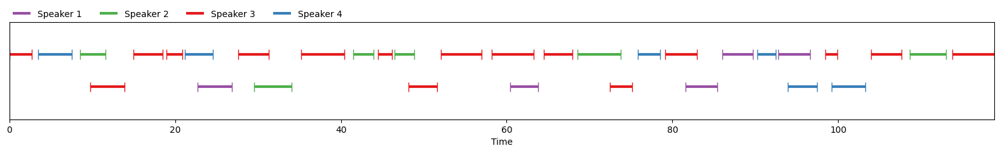

In [7]:
# better visualization
import pickle
from pyannote.core import Segment, Timeline, Annotation
from pyannote.metrics.diarization import DiarizationErrorRate

# I've already saved the label, here we simply load it
reference_pyannote = pickle.load(open("diarization_label.pkl", "rb"))

# visualization
reference_pyannote

In [8]:
# or get the information
print(reference_pyannote)

[ 00:00:00.000 -->  00:00:02.688] _ Speaker 3
[ 00:00:03.436 -->  00:00:07.532] _ Speaker 4
[ 00:00:08.508 -->  00:00:11.612] _ Speaker 2
[ 00:00:09.766 -->  00:00:13.862] _ Speaker 3
[ 00:00:14.968 -->  00:00:18.520] _ Speaker 3
[ 00:00:18.958 -->  00:00:20.878] _ Speaker 3
[ 00:00:21.168 -->  00:00:24.528] _ Speaker 4
[ 00:00:22.723 -->  00:00:26.819] _ Speaker 1
[ 00:00:27.632 -->  00:00:31.280] _ Speaker 3
[ 00:00:29.542 -->  00:00:34.054] _ Speaker 2
[ 00:00:35.201 -->  00:00:40.417] _ Speaker 3
[ 00:00:41.471 -->  00:00:43.935] _ Speaker 2
[ 00:00:44.491 -->  00:00:46.187] _ Speaker 3
[ 00:00:46.490 -->  00:00:48.826] _ Speaker 2
[ 00:00:48.132 -->  00:00:51.588] _ Speaker 3
[ 00:00:52.042 -->  00:00:56.938] _ Speaker 3
[ 00:00:58.190 -->  00:01:03.246] _ Speaker 3
[ 00:01:00.438 -->  00:01:03.766] _ Speaker 1
[ 00:01:04.512 -->  00:01:07.968] _ Speaker 3
[ 00:01:08.576 -->  00:01:13.760] _ Speaker 2
[ 00:01:12.462 -->  00:01:15.118] _ Speaker 3
[ 00:01:15.857 -->  00:01:18.481] 

Your meeting transcription system should do the following two things:
- Generate a speaker activity timeline as the one visualized above.
- Transcribe each speaker's active segments into texts.

Here is an example about the design of the pipeline:
1. Train a **VAD** to detect speech/nonspeech regions in the audio. You can easily extract the oracle nonspeech regions by examine the start/end times of all the segments, and you can use either a SVM or a neural network for your VAD. The VAD can segment the 2-minute audio into multiple shorter blocks whose boundaries are the nonspeech periods.
2. For each of the segments split by the VAD, detect whether there are speaker overlap. Again, the target label for overlap/nonoverlap can be easily calculated by the start/end times. If a segment contains overlap, train a **speech separator** to separate the two audio clips. There are two ways you can do it:
 - Train an **acoustic-event-detection module** to perform segment-level binary classification to see if each segment contains overlap. Only apply the separator to the ones with overlap.
 - Ask the speech separation network to always perform separation. For the segments who only has 1 active speaker, set the other separation target to an all-zero audio. For the all-zero separation outputs, discard them and don't use them in the upcoming steps.
   
  After this step, each segment should contain 1 or 2 single-speaker utterances. In the cases where the utterances are not fully overlapped in the segment, recalculate the start/end times of all the utterances.
3. For each single-speaker utterance in each segment, train a **speaker identification module** to determine the speaker information.
4. For each single-speaker utterance in each segment, train an **ASR module** to transcribe it into text.

You can also use any other pipelines that you come up with, only to make sure that your system's output should be both the speaker activity annotation like the one above, and the transcribed texts for each of the speakers. You can use any of the released sample solultions for the 4 coding homework in this project. Again, remember that you only need to ***overfit*** your model on this 2-minute sample.

We will not have a strict performance requirement for this final project and the grading will be based on your overall implementation. Try your best to achieve a good enough accuracy!

In [9]:
# TODO: build your meeting transcription system
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
from itertools import permutations

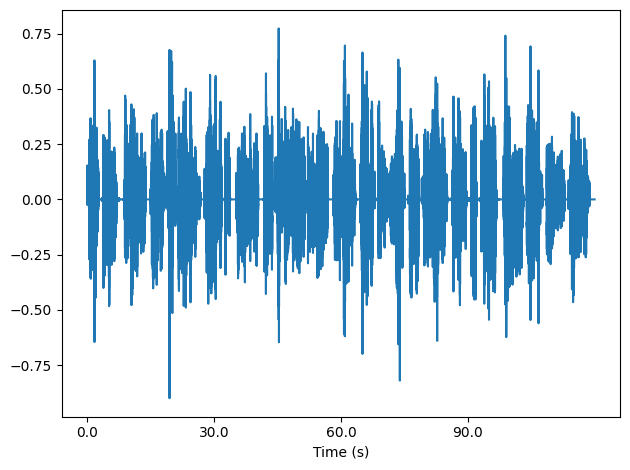

In [10]:
# visualize the audio
plt.plot(audio)
ticks_in_second = np.arange(len(audio)) / sr
max_second = np.floor(ticks_in_second[-1])
plt.xticks(ticks=np.arange(0, (max_second+1)*sr, (max_second+1)*sr/4), 
           labels=np.arange(0, (max_second+1), (max_second+1)/4))
plt.xlabel('Time (s)')
plt.tight_layout()

# VAD

In [11]:
# calculate Mel Spectrogram using 64 filters for Mel filterbank
# audio spectrogram magnitude: (257, 7501)
audio_spec = librosa.stft(audio, n_fft=512, hop_length=256)
audio_spec_mag = np.abs(audio_spec)

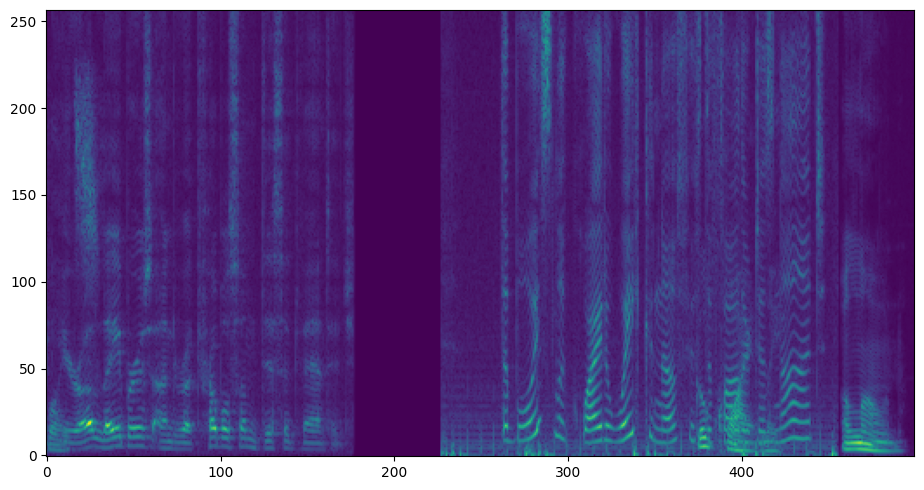

In [12]:
# visualize part of it
plt.figure(figsize=(10, 5))
plt.imshow(audio_spec_mag[:,1500:2000]**0.33, origin='lower')
plt.tight_layout()

In [13]:
# Create labels for VAD
labels = np.any(audio_spec_mag>0,axis=0).astype(int)

# generate data for train, validation, the test dataset is the whole dataset
train_data = audio_spec_mag
val_data = audio_spec_mag[:,750:1500]
test_data = audio_spec_mag[:,:750]

train_label = labels
val_label = labels[750:1500]
test_label = labels[:750]

# MVN
train_mean = np.mean(train_data, 1)
train_var = np.var(train_data, 1)

train_data = (train_data - train_mean[:,np.newaxis]) / train_var[:,np.newaxis]
val_data = (val_data - train_mean[:,np.newaxis]) / train_var[:,np.newaxis]
test_data = (test_data - train_mean[:,np.newaxis]) / train_var[:,np.newaxis]

# the function to calcualte the accuracy
def Accuracy(predicts, labels):
    '''
    Compute accuracy of predicted labels against true labels.
    args:
        predicts: binary array or tensor of shape (num_frame, )
        labels: binary array or tensor of shape (num_frame, )
    return:
        scalar float accuracy between 0 and 1
    '''
    assert len(predicts) == len(labels)
    result = (predicts == labels)
    if torch.is_tensor(result):
        return (sum(result)/len(result)).to(torch.float32).item()
    return sum(result)/len(result)

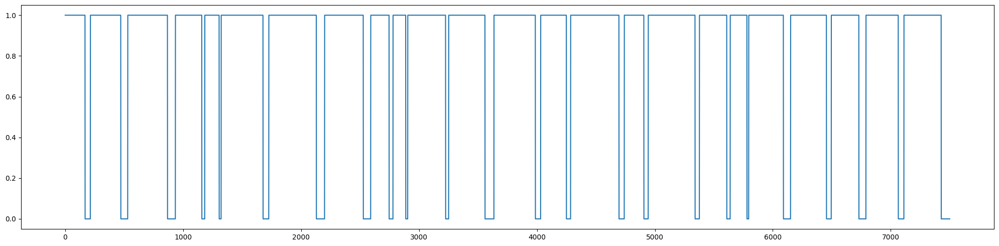

In [14]:
# visualize the labels
plt.figure(figsize=(20, 5))
plt.plot(labels)
plt.tight_layout()

In [15]:
from sklearn.svm import LinearSVC

# Instantiate a SVM classifier
svm = LinearSVC(random_state=0, max_iter=1000)

# Train your classifier 
svm.fit(train_data.transpose(1,0),train_label) 

# Make prediction on the training, validation, and test sets
train_predict_svm = svm.predict(train_data.transpose(1,0))
val_predict_svm = svm.predict(val_data.transpose(1,0))
test_predict_svm = svm.predict(test_data.transpose(1,0))

# # Calculate accuracy on the training, validation, and test sets
train_acc_svm = Accuracy(train_predict_svm, train_label)
val_acc_svm = Accuracy(val_predict_svm, val_label)
test_acc_svm = Accuracy(test_predict_svm, test_label)

print(f'Train set accuracy: {str(round(train_acc_svm*100, 1))}%')
print(f'Val set accuracy: {str(round(val_acc_svm*100, 1))}%')
print(f'Test set accuracy: {str(round(test_acc_svm*100, 1))}%')

Train set accuracy: 95.9%
Val set accuracy: 98.9%
Test set accuracy: 96.0%


e:\Python\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


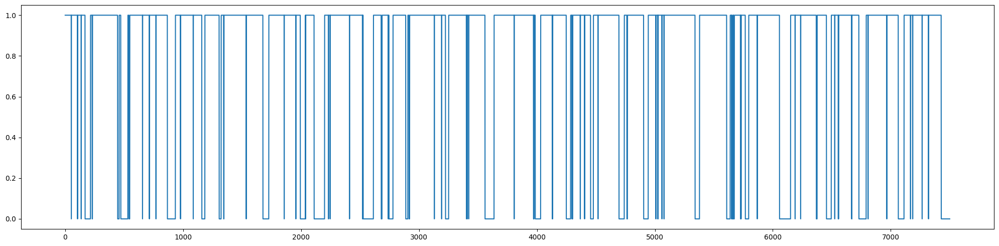

In [16]:
# spoken_status, 1 speech segment, 0 nonspeech segement
spoken_status = svm.predict(train_data.transpose(1,0))
# visualize the spoken_status
plt.figure(figsize=(20, 5))
plt.plot(spoken_status)
plt.tight_layout()

In [17]:
# define the smoothing function
# increase accuracy, and make sure the small number of 0 between 1 is diminished
def smoothing(prediction, context=47):
    # prediction: shape (num_frame,)
    smooth_pred = np.convolve(prediction, np.ones(context)/context, 'valid')
    pred = np.pad(smooth_pred, (context//2, context//2), 'edge')
    return pred

smooth_spoken_status = smoothing(spoken_status).round()
print(f"After smoothing, prediction Accuracy is {Accuracy(smooth_spoken_status, labels)}")

After smoothing, prediction Accuracy is 0.9644047460338622


# Speaker Overlap

In [19]:
def check_nonzero_arrays(arr1, arr2, arr3, arr4):
    non_zero_arrays = {}
    if np.count_nonzero(arr1) > 0:
        if np.count_nonzero(arr1) > 30:
            non_zero_arrays[0] = (np.count_nonzero(arr1))
    if np.count_nonzero(arr2) > 0:
        if np.count_nonzero(arr2) > 30:
            non_zero_arrays[1] = (np.count_nonzero(arr2))
    if np.count_nonzero(arr3) > 0:
        if np.count_nonzero(arr3) > 30:
            non_zero_arrays[2] = (np.count_nonzero(arr3))
    if np.count_nonzero(arr4) > 0:
        if np.count_nonzero(arr4) > 30:
            non_zero_arrays[3] = (np.count_nonzero(arr4))

    if len(non_zero_arrays) >= 2:
        if len(non_zero_arrays) > 2:
            # only keep the top 2 speakers
            sorted_values = sorted(non_zero_arrays.values(), reverse=True)
            top_two_values = sorted_values[:2]
            non_zero_arrays = {key: value for key, value in non_zero_arrays.items() if value in top_two_values}
        return 1, list(non_zero_arrays.keys())
    else:
        return 0, list(non_zero_arrays.keys())


In [20]:
# generate labels
# for speech, nonspeech area, if the speech area less than 25 length, make it 0, unspeech.
# record the start and end index of each grouping segment
# for each segment, create label by find if at least two spk speak at this area.
def overlap_grouping(mix_mag, pred, label, threshold=30):
    # starts is the index for start of each 1, [0,1,1,0], starts = [1]
    starts, = np.where(np.diff(pred, prepend=0) == 1)
    # end is the index for end of each 1, starts = [2]
    # starts:end+1 is the slice
    ends, = np.where(np.diff(pred, append=0) == -1)
    
    # l is the length of the segmentation
    l = ends-starts+1
    start_list = []
    end_list = []
    len_list = []
    # if the length is less than 25, delete this group
    for group in range(len(l)):
        if l[group] > threshold:
            start_list.append(starts[group])
            end_list.append(ends[group])
            len_list.append(l[group])
    start_list, end_list, len_list = np.array(start_list), np.array(end_list), np.array(len_list)

    # Get the clean spk audio
    spk1_audio = label['Speaker 1']['Audio']
    spk2_audio = label['Speaker 2']['Audio']
    spk3_audio = label['Speaker 3']['Audio']
    spk4_audio = label['Speaker 4']['Audio']

    # get the mag of them
    spk1_mag = np.abs(librosa.stft(spk1_audio, n_fft=512, hop_length=256))
    spk2_mag = np.abs(librosa.stft(spk2_audio, n_fft=512, hop_length=256))
    spk3_mag = np.abs(librosa.stft(spk3_audio, n_fft=512, hop_length=256))
    spk4_mag = np.abs(librosa.stft(spk4_audio, n_fft=512, hop_length=256))

    # for each group, if any two of them overlap, then the labels is 1
    overlap_label = np.zeros_like(start_list)
    
    # find the largest length
    max_len = max(len_list)

    # the mixture data for each group
    data = np.empty((mix_mag.shape[0]*max_len,0))
    # the spk for each group, two speakers
    spks = []
    mix_spec = {}
    separated_spec = {}

    all_spec = {}
    all_spk = []

    # for each group
    for i in range(len(overlap_label)):
        # get the index of the mag
        starts_index = start_list[i]
        end_index = end_list[i] + 1

        # the mix mag for this group, (257, length)
        mix = mix_mag[:,starts_index:end_index]
        # pad the mag to the max, (257*max,1)

        padded_array = np.pad(mix, ((0, 0), (0, max_len-len_list[i])), mode='constant')
        data = np.concatenate((data, padded_array.reshape(-1,1)), axis=1)

        # get the magnitude of this group
        spk1 = spk1_mag[:,starts_index:end_index].flatten()
        spk2 = spk2_mag[:,starts_index:end_index].flatten()
        spk3 = spk3_mag[:,starts_index:end_index].flatten()
        spk4 = spk4_mag[:,starts_index:end_index].flatten()
        spk_sepc_mag = [spk1_mag[:,starts_index:end_index], spk2_mag[:,starts_index:end_index], spk3_mag[:,starts_index:end_index], spk4_mag[:,starts_index:end_index]]
        
        all_spec[i] = padded_array
        
        overlap_label[i], spk = check_nonzero_arrays(spk1, spk2, spk3, spk4)
        all_spk.append(spk)

        if overlap_label[i] > 0:
            # pad the two seperated spec to the max_len, (257,max_len,1)
            s = np.empty((mix_mag.shape[0],max_len,0))
            s = np.concatenate((s,np.pad(spk_sepc_mag[spk[0]], ((0, 0), (0, max_len-len_list[i])), mode='constant')[:,:,np.newaxis]), axis=2)
            s = np.concatenate((s,np.pad(spk_sepc_mag[spk[1]], ((0, 0), (0, max_len-len_list[i])), mode='constant')[:,:,np.newaxis]), axis=2)
            # get the seperated data for two spks
            separated_spec[i] = s
            # get the mixture data
            mix_spec[i] = padded_array
            spks.append(spk)


    return overlap_label, data, mix_spec, separated_spec, spks, start_list, end_list, all_spec, all_spk

In [21]:
# get the speech area, and the overlap label for each group(speech area)
overlap_label, segmentation_mix_mag, mix_spec_dic, seperated_spec_dict, spk_list, starts, ends, all_mix_spec, all_spk = overlap_grouping(audio_spec_mag, smooth_spoken_status, label)

In [22]:
train_mean = np.mean(segmentation_mix_mag, 1)
train_var = np.var(segmentation_mix_mag, 1)
segmentation_data = (segmentation_mix_mag - train_mean[:,np.newaxis]) / train_var[:,np.newaxis]

from sklearn.svm import LinearSVC

# Instantiate a SVM classifier
svm_overlap = LinearSVC(random_state=0, max_iter=1000)

# Train your classifier 
svm_overlap.fit(segmentation_data.transpose(1,0),overlap_label) 

# Make prediction on the training, validation, and test sets
train_predict_svm = svm_overlap.predict(segmentation_data.transpose(1,0))

# # Calculate accuracy on the training, validation, and test sets
train_acc_svm = Accuracy(train_predict_svm, overlap_label)

print(f'Train set accuracy: {str(round(train_acc_svm*100, 1))}%')

Train set accuracy: 100.0%


e:\Python\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [23]:
# Now we have the overlap status, we need which segmentation is overlap
overlap_status = train_predict_svm
overlap_status

array([0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0,
       0, 0], dtype=int64)

# Speech Seperation

In [24]:
# 1. get the index of the overlap_status as new list overlap: get which segmentation has the overlap status

# 2. create dataloader, sample index i, overlap[i] = 2, segmentation 2, 
# mixture_input = mix_spec_dic[overlap[i]], (257, 492)
# the label: sperated_spec = seperated_spec_dict[overlap[i]], (257, 492, 2)

In [25]:
# create data loader pipeline
from torch.utils.data import Dataset, DataLoader

batch_size = 2

class dataset_pipeline(Dataset):
    def __init__(self, mix_spec_dic, seperated_spec_dict, overlap_label):
        super(dataset_pipeline, self).__init__()
        self.mix_mag_dic = mix_spec_dic
        self.sep_mag_dic = seperated_spec_dict
        self.seg_overlap = overlap_label
        self.overlap = np.where(overlap_label==1)[0]
        # the number of overlap segmentations
        self._len = len(self.overlap)

    
    def __getitem__(self, index):
        # (257, 492)
        mixture_mag_spec = torch.from_numpy(self.mix_mag_dic[self.overlap[index]])
        # sperated_spec (257, 492, 2)
        seperated_spec = seperated_spec_dict[self.overlap[index]]
        # speech1_mag_spec (257, 492)
        speech1_mag_spec = torch.from_numpy(seperated_spec[:,:,0])
        # speech2_mag_spec (257, 492)
        speech2_mag_spec = torch.from_numpy(seperated_spec[:,:,1])
        
        # target WFMs, each is (freq, time) = (257, 492)
        eps = 1e-6  # numerical stability
        spk1_WFM = speech1_mag_spec**2 / (speech1_mag_spec**2 + speech2_mag_spec**2 + eps)
        spk2_WFM = speech2_mag_spec**2 / (speech1_mag_spec**2 + speech2_mag_spec**2 + eps)

        # get seperated spec (num_target, freq, time)
        separated_spk1_spec = spk1_WFM * mixture_mag_spec
        separated_spk2_spec = spk2_WFM * mixture_mag_spec
        separated_spec = torch.stack([separated_spk1_spec, separated_spk2_spec])

        return mixture_mag_spec, separated_spec
    
    def __len__(self):
        return self._len

In [26]:
# define data loaders
train_loader = DataLoader(dataset_pipeline(mix_spec_dic, seperated_spec_dict, overlap_label), 
                          batch_size=batch_size, 
                          shuffle=True,
                         )

validation_loader = DataLoader(dataset_pipeline(mix_spec_dic, seperated_spec_dict, overlap_label), 
                          batch_size=1, 
                          shuffle=False,
                         )

dataset_len = len(train_loader)
log_step = dataset_len // 4

In [27]:
# a 2-layer LSTM

class DeepLSTM(nn.Module):  
    def __init__(self, feature_dim):
        super(DeepLSTM, self).__init__()
        
        # layers, and activation function
        self.feature_dim = feature_dim
        self.hidden_unit = 128  # number of hidden units
    
        # LSTM
        self.layer1 = nn.LSTM(self.feature_dim, self.hidden_unit, batch_first = True, num_layers = 1, bidirectional = True)
        self.layer2 = nn.LSTM(self.hidden_unit*2, self.hidden_unit, batch_first = True, num_layers = 1, bidirectional = True)

        # output layer
        # this is an FC layer 
        self.output = nn.Linear(self.hidden_unit*2, self.feature_dim)

        self.Sigmoid = nn.Sigmoid()
        
    # the function for the forward pass of network (i.e. from input to output)
    def forward(self, input):
        # the input is a batch of spectrograms with shape (batch_size, frequency_dim, time_step)

        batch_size, freq_dim, time_step = input.shape
        
        # note that LSTM layers require input with shape (batch_size, sequence_length, feature_dim)
        # so here we need to reshape the input
        
        # make it (batch, time, freq), swap the two dimensions
        input = input.transpose(1, 2).contiguous()  
        
        # apply MVN
        mean = torch.mean(input, dim=(0, 1), keepdim=True)
        var = torch.var(input, dim=(0, 1), keepdim=True)

        input = (input - mean) / torch.sqrt(var)

        # pass through LSTM
        output,_ = self.layer1(input)
        output,_ = self.layer2(output)

        # the output should have shape (batch, time, hidden_unit)
        # pass to the output layer

        # input for this FC layer (batch*time, freq)
        output = self.output(output.contiguous().view(batch_size*time_step, -1))  

        # the output: (batch, time, freq)

        output = self.Sigmoid(output)
        
        # reshape back
        output = output.view(batch_size, time_step, freq_dim)  # (batch, time, freq)

        # create another WFM
        output2 = 1 - output

        # stack them together and reshape
        output = torch.stack([output, output2]) # (2, batch, time, freq)
        output = output.permute(1, 0, 3, 2).contiguous()  # (batch_size, 2, freq, time)
        
        return output
    
model_LSTM = DeepLSTM(feature_dim=257)
optimizer = optim.Adam(model_LSTM.parameters(), lr=5e-3)

In [28]:
# the  batch-level MSE objective with PIT

def PIT_MSE(estimation, target):
    """
    args:
        estimation: Pytorch tensor, shape (batch_size, num_target, freq, time)
        target: Pytorch tensor, shape (batch_size, num_target, freq, time)
    output:
        mse: single scalar, average MSE across all dimensions
    """
    # get the number of target
    num_target = estimation.shape[1]

    # get all the permutations
    perms = permutations(range(num_target))

    # assume MSE = infinite
    mse = float('inf')

    # calculate MSE for each perm and choose the smallest MSE
    for perm in perms:
        estimation_perm = estimation[:, perm, :, :]
        mse_perm = torch.mean(torch.pow(estimation_perm - target, 2))

        if mse_perm < mse:
            mse = mse_perm

    return mse

In [29]:
def train(model, epoch, versatile=True):
    start_time = time.time()
    model = model.train()  # set the model to training mode. Always do this before you start training!
    train_loss = 0.
    
    # load batch data
    for batch_idx, data in enumerate(train_loader):
        # (Batch, feature, time) = (4,257,492)
        mixture_mag_spec = data[0]
        # (Batch, 2, feature, time) = (4,2,257,492)
        target = data[1]
        
        # clean up the gradients in the optimizer
        # this should be called for each batch
        optimizer.zero_grad()
        
        # output: two WFMs (batch_size, 2, freq, time) = [4, 2, 257, 492]
        output = model(mixture_mag_spec)

        # get each WFM, [4, 257, 492]
        spk1_WFM = output[:, 0, :, :]
        spk2_WFM = output[:, 1, :, :]

        # get seperated spec (Batch, freq, time) = [4, 257, 492]
        separated_spk1_spec = spk1_WFM * mixture_mag_spec
        separated_spk2_spec = spk2_WFM * mixture_mag_spec
        # (num_target, batch, freq, time) = [2, 4, 257, 492]
        estimation = torch.stack([separated_spk1_spec, separated_spk2_spec])
        estimation = estimation.transpose(0, 1).contiguous()  # (batch, num_target, freq, time), swap the two dimension back

        # PIT_MSE as objective
        loss = PIT_MSE(estimation, target)
        
        # automatically calculate the backward pass
        loss.backward()
        # perform the actual backpropagation
        optimizer.step()
        
        train_loss += loss.data.item()
        
        # print the training progress 
        if versatile:
            if (batch_idx+1) % log_step == 0:
                elapsed = time.time() - start_time
                print('| epoch {:3d} | {:5d}/{:5d} batches | ms/batch {:5.2f} | MSE {:5.4f} |'.format(
                    epoch, batch_idx+1, len(train_loader),
                    elapsed * 1000 / (batch_idx+1), 
                    train_loss / (batch_idx+1)
                    ))
    
    train_loss /= (batch_idx+1)
    print('-' * 99)
    print('    | end of training epoch {:3d} | time: {:5.2f}s | MSE {:5.4f} |'.format(
            epoch, (time.time() - start_time), train_loss))
    
    return train_loss
        
def validate(model, epoch):
    start_time = time.time()
    model = model.eval()  # set the model to evaluation mode. Always do this during validation or test phase!
    validation_loss = 0.
    
    # load batch data
    for batch_idx, data in enumerate(validation_loader):
        mixture_mag_spec = data[0]
        target = data[1]
        
        # you don't need to calculate the backward pass and the gradients during validation
        # so you can call torch.no_grad() to only calculate the forward pass to save time and memory
        with torch.no_grad():

            # output: two WFMs (batch_size, 2, freq, time)
            output = model(mixture_mag_spec)

            # get each WFM
            spk1_WFM = output[:, 0, :, :]
            spk2_WFM = output[:, 1, :, :]

            # get seperated spec (num_target, freq, time)
            separated_spk1_spec = spk1_WFM * mixture_mag_spec
            separated_spk2_spec = spk2_WFM * mixture_mag_spec
            estimation = torch.stack([separated_spk1_spec, separated_spk2_spec])
            estimation = estimation.transpose(0, 1).contiguous()  # (batch, num_target, freq, time), swap the two dimension back

            # PIT_MSE as objective
            loss = PIT_MSE(estimation, target)
            validation_loss += loss.data.item()
    
    validation_loss /= (batch_idx+1)
    print('    | end of validation epoch {:3d} | time: {:5.2f}s | MSE {:5.4f} |'.format(
            epoch, (time.time() - start_time), validation_loss))
    print('-' * 99)
    
    return validation_loss

In [614]:
# hyperparameters and model training

total_epoch = 150  # train the model for 150 epochs
model_save = 'best_model_Speech_separation.pt'  # path to save the best validation model

# main function

training_loss = []
validation_loss = []

for epoch in range(1, total_epoch + 1):
    training_loss.append(train(model_LSTM, epoch, versatile=False))
    validation_loss.append(validate(model_LSTM, epoch))
    
    if training_loss[-1] == np.min(training_loss):
        print('      Best training model found.')
    if validation_loss[-1] == np.min(validation_loss):
        # save current best model on validation set
        with open(model_save, 'wb') as f:
            torch.save(model_LSTM.state_dict(), f)
            print('      Best validation model found and saved.')
    
    print('-' * 99)

---------------------------------------------------------------------------------------------------
    | end of training epoch   1 | time:  1.71s | MSE 0.1765 |
    | end of validation epoch   1 | time:  0.56s | MSE 0.1381 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
---------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------
    | end of training epoch   2 | time:  1.36s | MSE 0.1471 |
    | end of validation epoch   2 | time:  0.60s | MSE 0.0998 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
--------------------------------------------------------------------------------------------

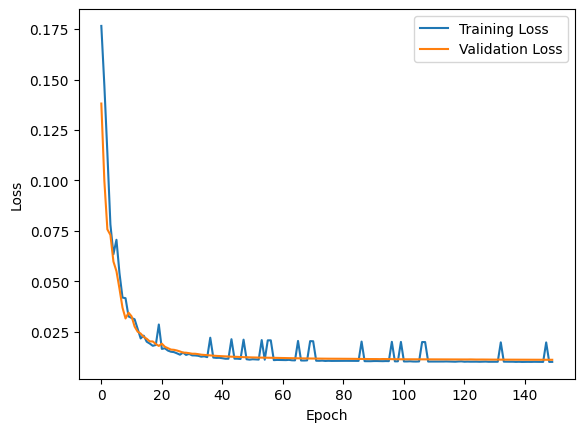

In [618]:
# plot the loss of the seperation model
plt.plot(training_loss, label='Training Loss')
plt.plot(validation_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

In [31]:
model_save = 'best_model_Speech_separation.pt'  # path to save the best validation model
model_LSTM.load_state_dict(torch.load(model_save))
validate(model_LSTM, 1)

    | end of validation epoch   1 | time:  0.53s | MSE 0.0112 |
---------------------------------------------------------------------------------------------------


0.011175211863411942

## Show one example of seperation

In [32]:
model_LSTM = model_LSTM.eval()  # set the model to evaluation mode. Always do this during validation or test phase!
mixture_mag_spec = mix_spec_dic[2]
target = seperated_spec_dict[2]

with torch.no_grad():
    # output: two WFMs (batch_size, 2, freq, time)
    output = model_LSTM(torch.from_numpy(mixture_mag_spec[np.newaxis,:,:]))

    # get each WFM
    spk1_WFM = output[:, 0, :, :]
    spk2_WFM = output[:, 1, :, :]

    # get seperated spec [1, 257, 492]
    separated_spk1_spec = (spk1_WFM * mixture_mag_spec[np.newaxis,:,:]).squeeze()
    separated_spk2_spec = (spk2_WFM * mixture_mag_spec[np.newaxis,:,:]).squeeze()

# this is the sepc that has phase
example_audio_spec = audio_spec[:, starts[2]:ends[2]+1]
mixture_mag_spec = mixture_mag_spec[:, :example_audio_spec.shape[1]]
separated_spk1_spec = separated_spk1_spec[:, :example_audio_spec.shape[1]]
separated_spk2_spec = separated_spk2_spec[:, :example_audio_spec.shape[1]]

In [33]:
# the true audio
phase = np.angle(example_audio_spec)
mix_stft_result = mixture_mag_spec * np.exp(1j * phase)
y = librosa.istft(np.asarray(mix_stft_result), win_length=512, hop_length=256)
Audio(y, rate=sr)

In [34]:
spk1_stft_result = separated_spk1_spec * np.exp(1j * phase)
y = librosa.istft(np.asarray(spk1_stft_result), win_length=512, hop_length=256)
Audio(y, rate=sr)

In [35]:
spk2_stft_result = separated_spk2_spec * np.exp(1j * phase)
y = librosa.istft(np.asarray(spk2_stft_result), win_length=512, hop_length=256)
Audio(y, rate=sr)

# Speaker Identification module

For this part, we have 24 segmentations.

For each segmentation i, if it is no overlap by known by overlap_status, then we get its mag from all_mix_spec[i] (257, 492), and spk from all_spk[i][0]: 2. Add magnitude to dict, Add spk to spk_label.

if it is overlap by known by overlap_label, we get its mix mag from all_mix_spec[i] (257, 492), Then we get its two seperated mag from the Seperation model, then get spk from all_spk[i]: [1,2]. Add magnitude to dict, Add spk to spk_label.


In [36]:
# convert the index from mag to the timeline
def index_time_transform(index, sr=16000):
    original_index = index*256
    t = original_index/sr
    return t

In [37]:
def SIM_data(all_mix_spec, all_spk, overlap_status, model_LSTM, starts, ends):
    magnitudes = []
    spk_label = []
    starts_time = []
    ends_time = []
    # for each segmentation
    for i in range(len(all_mix_spec)):
        # if it only have one spk
        if overlap_status[i] == 0:
            # add the magnitudes
            magnitudes.append(all_mix_spec[i])
            # add the spk label, 0~3
            spk_label.append(all_spk[i][0])

            # add the start time
            starts_time.append(starts[i])
            ends_time.append(ends[i])


        # if it have two spks
        else:
            model_LSTM = model_LSTM.eval()
            mixture_mag_spec = all_mix_spec[i]
            with torch.no_grad():
                # output: two WFMs (batch_size, 2, freq, time)
                output = model_LSTM(torch.from_numpy(mixture_mag_spec[np.newaxis,:,:]))

                # get each WFM
                spk1_WFM = output[:, 0, :, :]
                spk2_WFM = output[:, 1, :, :]

                # get seperated spec [1, 257, 492]
                separated_spk1_spec = (spk1_WFM * mixture_mag_spec[np.newaxis,:,:]).squeeze()
                separated_spk2_spec = (spk2_WFM * mixture_mag_spec[np.newaxis,:,:]).squeeze()

            # add the magnitudes 1
            magnitudes.append(separated_spk1_spec)
            # add the spk label, 0~3
            spk_label.append(all_spk[i][0])

            # add the start time
            starts_time.append(starts[i])
            ends_time.append(ends[i])

            # add the magnitudes 1
            magnitudes.append(separated_spk2_spec)
            # add the spk label, 0~3
            spk_label.append(all_spk[i][1])

            # add the start time
            starts_time.append(starts[i])
            ends_time.append(ends[i])


    return np.array(magnitudes), np.array(spk_label), np.array(starts_time), np.array(ends_time)

In [38]:
magnitudes, spk_label, starts_time, ends_time = SIM_data(all_mix_spec, all_spk, overlap_status, model_LSTM, starts, ends)

C:\Users\91688\AppData\Local\Temp\ipykernel_24056\3359080599.py:55: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  return np.array(magnitudes), np.array(spk_label), np.array(starts_time), np.array(ends_time)
C:\Users\91688\AppData\Local\Temp\ipykernel_24056\3359080599.py:55: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(magnitudes), np.array(spk_label

In [39]:
batch_size = 4

class SIM_data(Dataset):
    def __init__(self, magnitudes, spk_label):
        super(SIM_data, self).__init__()
        self.magnitudes = magnitudes
        self.spk_label = torch.from_numpy(spk_label).long()
        self._len = len(magnitudes)
        
    
    def __getitem__(self, index):
        mag_spec = self.magnitudes[index]
        if not torch.is_tensor(self.magnitudes[index]):
            mag_spec = torch.from_numpy(self.magnitudes[index])
        label = self.spk_label[index]
        
        return mag_spec, label
    
    def __len__(self):
        return self._len
    
# define data loaders
train_loader = DataLoader(SIM_data(magnitudes, spk_label), 
                          batch_size=batch_size, 
                          shuffle=True,  # this ensures that the sequential order of the training samples will be shuffled for different training epochs
                         )

validation_loader = DataLoader(SIM_data(magnitudes, spk_label), 
                               batch_size=1, 
                               shuffle=False,  # typically we fix the sequential order of the validation samples
                              )

dataset_len = len(train_loader)

In [40]:
# borrow the implementation of AlexNet from https://pytorch.org/vision/stable/_modules/torchvision/models/alexnet.html#alexnet
class AlexNet(nn.Module):
    def __init__(self, num_classes=4):
        super(AlexNet, self).__init__()
        self.bn = nn.BatchNorm2d(num_features=1)
        self.features = nn.Sequential(
            nn.Conv2d(1, 16, kernel_size=11, stride=4, padding=2),  # number of input channel is 1 (for image it is 3) 
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(16, 32, kernel_size=5, padding=2),  # we make the number of hidden channels smaller in these layers
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((3, 3))  # perform adaptive mean pooling on any size of the input to match the provided size
        self.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(64 * 3 * 3, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(256, 256),
            nn.ReLU(inplace=True),
            nn.Linear(256, num_classes),
        )

    def forward(self, x):
        x = self.bn(x)
        x = self.features(x)
        x = self.avgpool(x)  # the dimension after adaptive average pooling is (batch, 64, 3, 3)
        x = torch.flatten(x, 1)  # average
        x = self.classifier(x)
        return x
    
# test it with a sample input
model = AlexNet()
sample_input = torch.randn(2, 1, 257, 492)  # (batch_size, num_channel, freq_dim, time_step)
sample_output = model(sample_input)
print(sample_output.shape)  # (batch_size, num_classes)

torch.Size([2, 4])


In [41]:
def train(model, epoch, loss_fn, optimizer, train_loader):
    start_time = time.time()
    model = model.train()  # set the model to training mode. Always do this before you start training!
    train_loss = 0.
    true_label = torch.zeros(0)
    pred_label = torch.zeros(0)
    
    # load batch data
    for batch_idx, data in enumerate(train_loader):
        train_batch = data[0].unsqueeze(1)
        train_label = data[1]

        # add ture label
        true_label = torch.cat([true_label, train_label])
        
        # clean up the gradients in the optimizer
        # this should be called for each batch
        optimizer.zero_grad()
        
        output = model(train_batch)

        # add pred label
        pred_label = torch.cat([pred_label, torch.argmax(output, axis = 1)])

        # loss function as objective
        loss = loss_fn(output, train_label)
        
        # automatically calculate the backward pass
        loss.backward()
        # perform the actual backpropagation
        optimizer.step()
        
        train_loss += loss.data.item()
        
    accuracy = (torch.sum(true_label == pred_label).item())/len(true_label)
    train_loss /= (batch_idx+1)
    print('-' * 99)
    print('    | end of training epoch {:3d} | time: {:5.2f}s | Loss {:5.4f} | Accuracy {:5.4f} |'.format(
            epoch, (time.time() - start_time), train_loss, accuracy))
    
    return train_loss
        
def validate(model, epoch, loss_fn, validation_loader, test = False):
    start_time = time.time()
    model = model.eval()  # set the model to evaluation mode. Always do this during validation or test phase!
    validation_loss = 0.
    true_label = torch.zeros(0)
    pred_label = torch.zeros(0)
    
    # load batch data
    for batch_idx, data in enumerate(validation_loader):
        test_batch = data[0].unsqueeze(1)
        test_label = data[1]

        # add ture label
        true_label = torch.cat([true_label, test_label])
        
        # you don't need to calculate the backward pass and the gradients during validation
        # so you can call torch.no_grad() to only calculate the forward pass to save time and memory
        with torch.no_grad():
        
            output = model(test_batch)

            # add pred label
            pred_label = torch.cat([pred_label, torch.argmax(output, axis = 1)])
        
            # loss function as objective
            loss = loss_fn(output, test_label)
        
            validation_loss += loss.data.item()
    
    accuracy = (torch.sum(true_label == pred_label).item())/len(true_label)
    validation_loss /= (batch_idx+1)
    if test:
        print('    | end of test epoch {:3d} | time: {:5.2f}s | Loss {:5.4f} | Accuracy {:5.4f} |'.format(
                epoch, (time.time() - start_time), validation_loss, accuracy))
        print('-' * 99)
    else:
        print('    | end of validation epoch {:3d} | time: {:5.2f}s | Loss {:5.4f} | Accuracy {:5.4f} |'.format(
                epoch, (time.time() - start_time), validation_loss, accuracy))
        print('-' * 99)
    
    return validation_loss, accuracy, true_label, pred_label

In [941]:
model = AlexNet()
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

total_epoch = 150  # train the model for 100 epochs
model_save = 'best_SIM_model.pt'  # path to save the best validation model

# main function

training_loss = []
validation_loss = []
valid_acc = []

min_valid_loss = torch.inf
epoch_count = 0

for epoch in range(1, total_epoch + 1):
    training_loss.append(train(model, epoch, loss_fn, optimizer, train_loader=train_loader))
    valid_loss, acc, _, _ = validate(model, epoch, loss_fn, validation_loader=validation_loader)
    validation_loss.append(valid_loss)
    valid_acc.append(acc)

    if training_loss[-1] == np.min(training_loss):
        print('      Best training model found.')
    if validation_loss[-1] == np.min(validation_loss):
        # save current best model on validation set
        with open(model_save, 'wb') as f:
            torch.save(model.state_dict(), f)
            print('      Best validation model found and saved.')

    if validation_loss[-1] > min_valid_loss:
        min_valid_loss = validation_loss[-1]
        epoch_count += 1

        if epoch_count >= 10:
            print("      The validation loss has not decrease for 10 epoches, so the training stop early.")

    print('-' * 99)

---------------------------------------------------------------------------------------------------
    | end of training epoch   1 | time:  0.22s | Loss 1.3888 | Accuracy 0.4242 |
    | end of validation epoch   1 | time:  0.07s | Loss 1.3609 | Accuracy 0.4242 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
---------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------
    | end of training epoch   2 | time:  0.20s | Loss 1.3680 | Accuracy 0.4242 |
    | end of validation epoch   2 | time:  0.07s | Loss 1.3349 | Accuracy 0.4242 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
----------------

Text(0, 0.5, 'Validation Accuracy')

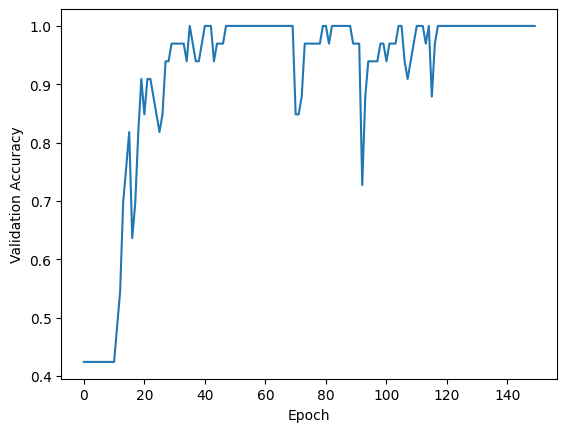

In [942]:
plt.plot(valid_acc, label='Validation Acc')
plt.xlabel('Epoch')
plt.ylabel("Validation Accuracy")

In [43]:
model_save = "best_SIM_model.pt"
loss_fn = torch.nn.CrossEntropyLoss()
model.load_state_dict(torch.load(model_save))
validation_loss, accuracy, true_label, pred_label = validate(model, 1, loss_fn, validation_loader)

    | end of validation epoch   1 | time:  0.08s | Loss 0.0005 | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------


In [44]:
speakers = pred_label+1
speakers

tensor([3., 4., 2., 3., 3., 1., 4., 2., 3., 2., 3., 2., 2., 3., 3., 1., 3., 3.,
        2., 2., 3., 4., 1., 3., 1., 4., 1., 4., 3., 4., 3., 2., 3.])

# ASR

In [45]:
from transformers import Wav2Vec2ForCTC, Wav2Vec2Tokenizer

# Load pretrained model and tokenizer
tokenizer = Wav2Vec2Tokenizer.from_pretrained("facebook/wav2vec2-base-960h")
model = Wav2Vec2ForCTC.from_pretrained("facebook/wav2vec2-base-960h")

The tokenizer class you load from this checkpoint is not the same type as the class this function is called from. It may result in unexpected tokenization. 
The tokenizer class you load from this checkpoint is 'Wav2Vec2CTCTokenizer'. 
The class this function is called from is 'Wav2Vec2Tokenizer'.
e:\Python\lib\site-packages\transformers\models\wav2vec2\tokenization_wav2vec2.py:752: FutureWarning: The class `Wav2Vec2Tokenizer` is deprecated and will be removed in version 5 of Transformers. Please use `Wav2Vec2Processor` or `Wav2Vec2CTCTokenizer` instead.
  warnings.warn(
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base-960h and are newly initialized: ['wav2vec2.masked_spec_embed']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [54]:
# map each segment to the audio
merged_spk_seg = {}
time_spk_seg = {}
speakers = np.array(speakers, dtype=int)
for spk in range(len(speakers)):
    if speakers[spk] not in merged_spk_seg.keys():
        merged_spk_seg[speakers[spk]] = []
        merged_spk_seg[speakers[spk]].append(magnitudes[spk])

        time_spk_seg[speakers[spk]] = []
        time_spk_seg[speakers[spk]].append([starts_time[spk], ends_time[spk]])
    else:
        merged_spk_seg[speakers[spk]].append(magnitudes[spk])
        time_spk_seg[speakers[spk]].append([starts_time[spk], ends_time[spk]])

In [59]:
speakers_pyannote = []
starts_pyannote = []
ends_pyannote = []
transcriptions = []

for spk in time_spk_seg:
    for seg in range(len(time_spk_seg[spk])):
        # get the index of seg in mag
        left, right = time_spk_seg[spk][seg][0], time_spk_seg[spk][seg][1]
        # get the sepc with phase
        example_audio_spec = audio_spec[:, left:right+1]
        # calculate phase
        phase = np.angle(example_audio_spec)
        # get the segmentation
        t_seg = merged_spk_seg[spk][seg][:,:example_audio_spec.shape[1]]
        
        stft_result = t_seg * np.exp(1j * phase)
        # make it back to waveform
        waveform = librosa.istft(np.asarray(stft_result), win_length=512, hop_length=256)
        
        # tokenizer the input
        inputs = tokenizer(waveform, return_tensors="pt", padding="longest", truncation=True)
        with torch.no_grad():
            # generate output
            logits = model(inputs.input_values).logits
        # decode output
        predicted_ids = torch.argmax(logits, dim=-1)
        transcription = tokenizer.batch_decode(predicted_ids)[0]

        speakers_pyannote.append(spk)

        Pred_start = index_time_transform(left)
        Pred_end = index_time_transform(right)
        for i in label:
            for j in label[i]:
                if j == "Audio":
                    continue
                True_start = label[i][j]['Start']
                True_end = label[i][j]['End']

                if abs(True_start - Pred_start) < 1 and abs(True_end-Pred_end) < 1:
                    Pred_start = True_start
                    Pred_end = True_end

        starts_pyannote.append(Pred_start)
        ends_pyannote.append(Pred_end)
        transcriptions.append(transcription)
        
        print(f"Speaker {spk}: {index_time_transform(left)} -> {index_time_transform(right)}, {transcription}")

Speaker 3: 0.0 -> 2.688, YES AND A VERY RESPECTABLE ONE
Speaker 3: 8.624 -> 13.856, SHAS TO RAMBLES AND MODOC MEMORIES
Speaker 3: 14.96 -> 18.528, THE BOYS BELONG TO THE GENTLEMAN WHO IS A WIDOWER
Speaker 3: 27.632 -> 31.888, GO QUIETLY ALONE
Speaker 3: 35.2 -> 40.4, DO THEY STILL INSIST THAT MISS CHALLONER WAS THE ONLY PERSON IN THE ROOM WITH THEM AT THIS TIME
Speaker 3: 44.48 -> 51.584, ONLY A LITTLE FOOD WILL BE REQUIRED
Speaker 3: 52.032 -> 56.944, I KNOW IT SOUNDS FOOLISH BUT THE ALTERNATIVE IS SO IMPROBABLE
Speaker 3: 58.192 -> 63.712, THE VERY EMPERORS HAD ARRAYED THEMSELVES ON HER SIDE
Speaker 3: 64.512 -> 67.968, I TOOK QUITE A FANCY TO HIM WHY
Speaker 3: 71.664 -> 75.12, SEEMED REMARKABLY SMOOTH AND UNBROKEN
Speaker 3: 79.104 -> 85.44, BUT IF THE EMPERORS HAD BECOME CHRISTIAN THE EMPIRE HAD NOT
Speaker 3: 98.416 -> 103.264, TWO DAYS AFTERWARDS OUR NOCTURNAL ORGY BEGAN TO BE TALKED OF
Speaker 3: 103.936 -> 107.664, I ASKED AS SOON AS GEORGE HAD RETURNED TO MY SIDE
Speaker 3: 1

In [60]:
pred_reference_pyannote = Annotation()
for i in range(len(speakers_pyannote)):
    spk = speakers_pyannote[i]
    start_time = starts_pyannote[i]
    end_time = ends_pyannote[i]
    pred_reference_pyannote[Segment(start_time,end_time)] = spk

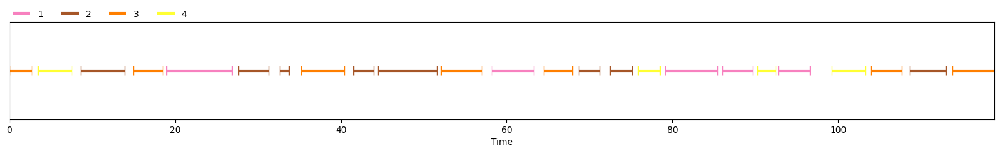

In [61]:
pred_reference_pyannote

One problem with this timeline just show the rough segment time this sentence fall into. The overlap of speeches overlap on each other in this graph since they are think as the same segment so they have same start and end time. It could make it looks better if we make it more precise on the specific time for each segment of each spk for one utterance.